# UMAPs Neurips samples, NK cells

In this notebook two aplastic samples (EG34 and EG36) are studied separately. NK cells are identified based on clustering results of each sample separately and then data is subset so that only NK cells from each sample are selected. UMAPs are generates using latent space coordinates. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
#Easigenomics dataset, two AA cases

adata = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/AA_norm.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 5469 × 11572
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm

In [4]:
eg34 = adata[adata.obs['eg_code'] == "EG34"]

eg34.shape

(1112, 11572)

In [5]:
eg35 = adata[adata.obs['eg_code'] == "EG35"]

eg35.shape

(2188, 11572)

In [6]:
eg36 = adata[adata.obs['eg_code'] == "EG36"]

eg36.shape

(2169, 11572)

In [7]:
#Removing mitochondrial and ribosomal genes

#genes to be removed
mito_genes = eg34.var_names.str.startswith('MT-')
ribo_genes = eg34.var_names.str.startswith('RPL')
ribo_genes1 = eg34.var_names.str.startswith('RPS')

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, ribo_genes1)

#other genes kept
keep = np.invert(remove)

eg34 = eg34[:,keep]

#print(adata_gex.n_obs, adata_gex.n_vars)

In [9]:
#Removing mitochondrial and ribosomal genes

#genes to be removed
mito_genes = eg35.var_names.str.startswith('MT-')
ribo_genes = eg35.var_names.str.startswith('RPL')
ribo_genes1 = eg35.var_names.str.startswith('RPS')

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, ribo_genes1)

#other genes kept
keep = np.invert(remove)

eg35 = eg35[:,keep]

#print(adata_gex.n_obs, adata_gex.n_vars)

In [10]:
#Removing mitochondrial and ribosomal genes

#genes to be removed
mito_genes = eg36.var_names.str.startswith('MT-')
ribo_genes = eg36.var_names.str.startswith('RPL')
ribo_genes1 = eg36.var_names.str.startswith('RPS')

remove = np.add(mito_genes, ribo_genes)
remove = np.add(remove, ribo_genes1)

#other genes kept
keep = np.invert(remove)

eg36 = eg36[:,keep]

#print(adata_gex.n_obs, adata_gex.n_vars)

## EG34 

In [12]:
eg34

AnnData object with n_obs × n_vars = 1112 × 11466
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersions_norm

In [11]:
#PCA for RNA

sc.pp.pca(eg34)

In [13]:
#calculating neigbors 

sc.pp.neighbors(eg34)

sc.tl.umap(eg34)

In [14]:
#Markers received from HR
#NCAM1, KLRC2 not found

nk_genes = ["FGFBP2", "FCGR3A", "S1PR5", "KLRC1", "KLRC3", "KLRD1", "GNLY","GZMB", "CX3CR1", "GPR56", "PRF1", "KLRB1", "SPON2", "NKG7", "TTC38", "FCRL6", "LILRB1","PLAC8", "MBP"]

nk_genes2 = ["KLRC1","GZMK","GZMA","KLRB1","GZMH","LAG3","B2M","HLA-DRA","OAS3","MX1","IRF7","MX2","IRF9","OAS1","OAS2", "EIF2AK2", "TNFRSF18",  "TNFRSF4",  "CRTAM", "ENTPD1",  "HAVCR2",  "TIGIT", "TNFSF10", "BCL2L11", "CCL3", "CCL4", "TNF", "IFNG", "CD69"]

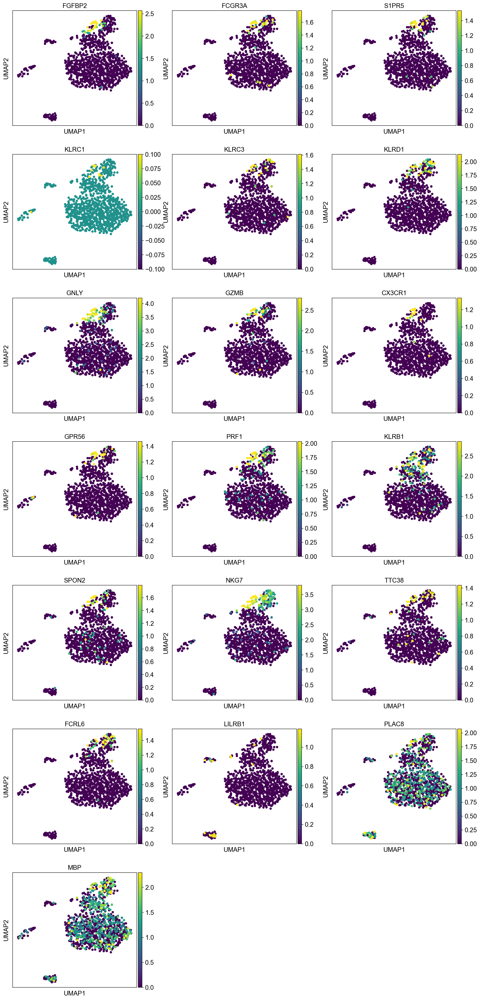

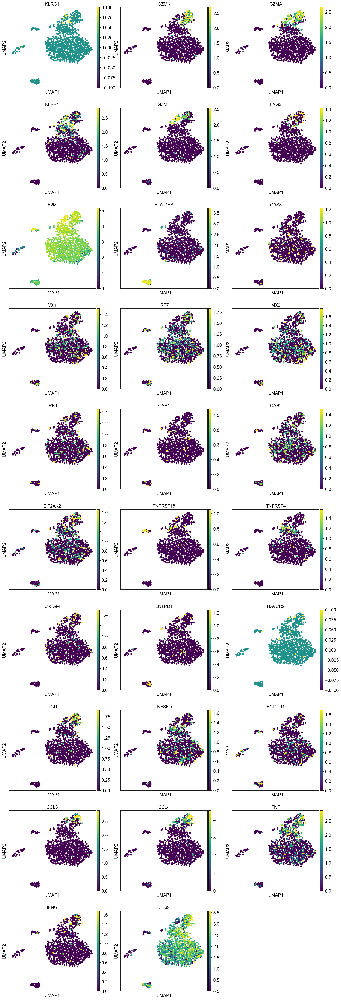

In [17]:

sc.set_figure_params(figsize=(5, 5))

sc.pl.umap(eg34, color= nk_genes, vmax="p99", ncols = 3)

sc.pl.umap(eg34, color= nk_genes2, vmax="p99", ncols = 3)

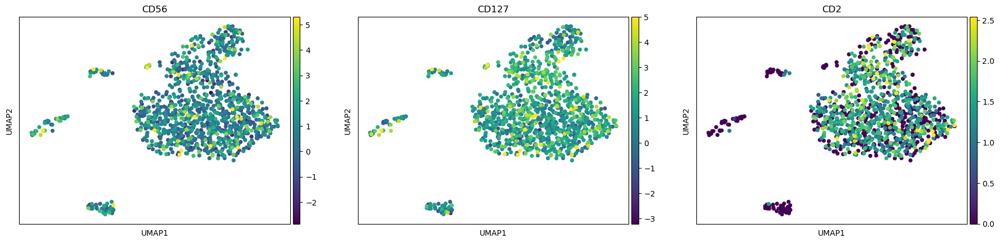

In [16]:
nk_prot = ['CD56', 'CD127', 'CD2']

sc.pl.umap(eg34, color= nk_prot, vmax="p99")

In [18]:
sc.tl.leiden(eg34, resolution = 1, key_added = "leiden_1")

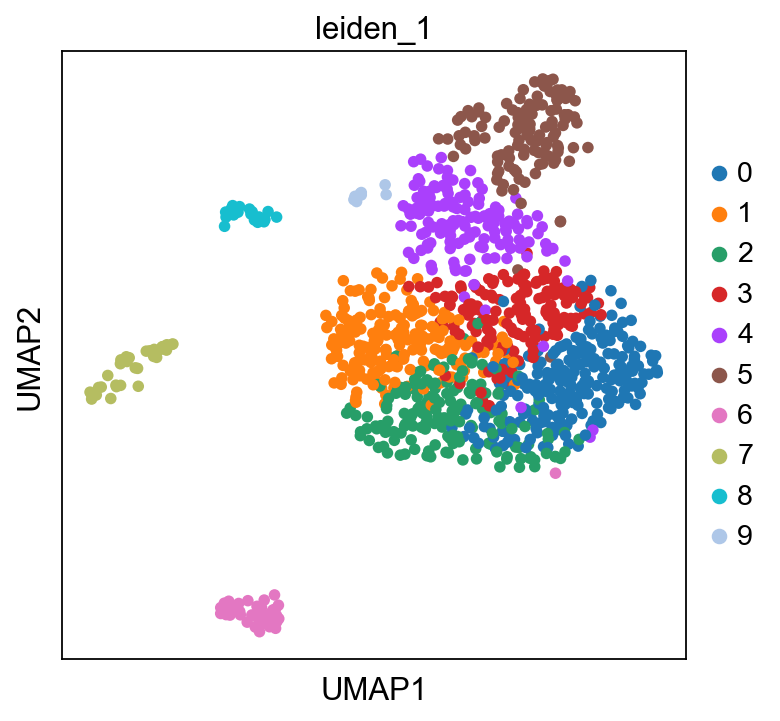

In [19]:
sc.pl.umap(eg34, color=['leiden_1'])

- Cluster 5 NK cells? 


In [20]:
#selecting NK cell cluster
eg34_nk = eg34[eg34.obs['leiden_1'] == "5"]

In [21]:
eg34_nk.shape

(120, 11466)

In [22]:
#calculating neigbors for object containing only NK cells, using latent space coordinates

sc.pp.neighbors(eg34_nk, use_rep="X_totalVI")

sc.tl.umap(eg34_nk)

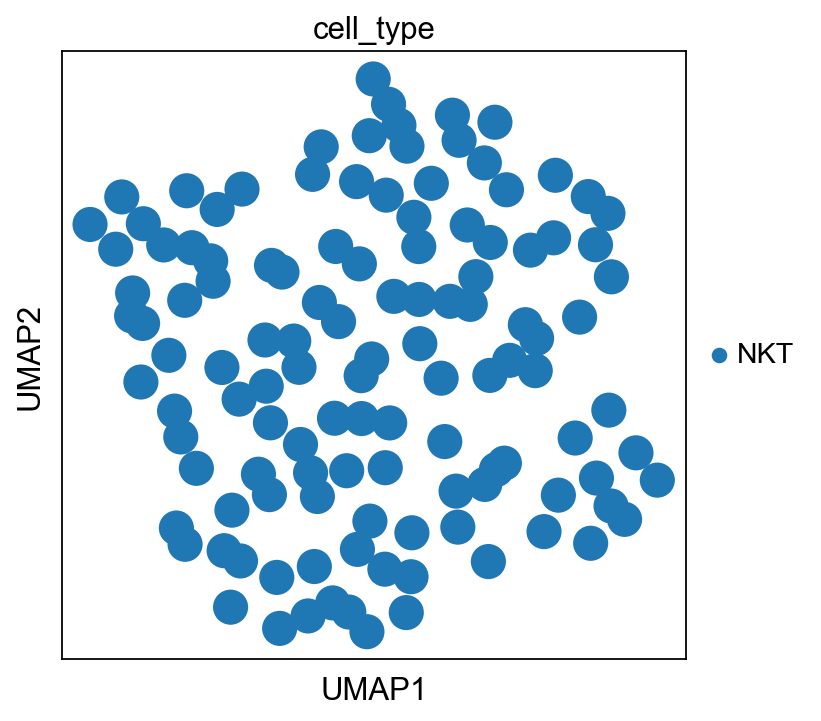

In [24]:
sc.pl.umap(eg34_nk, color = ["cell_type"])

## EG35

In [25]:
eg35

View of AnnData object with n_obs × n_vars = 2188 × 11466
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells-2', 'highly_variable-2', 'means-2', 'dispersions-2', 'dispersi

In [26]:
#PCA for RNA

sc.pp.pca(eg35)

In [27]:
#calculating neigbors 

sc.pp.neighbors(eg35)

sc.tl.umap(eg35)

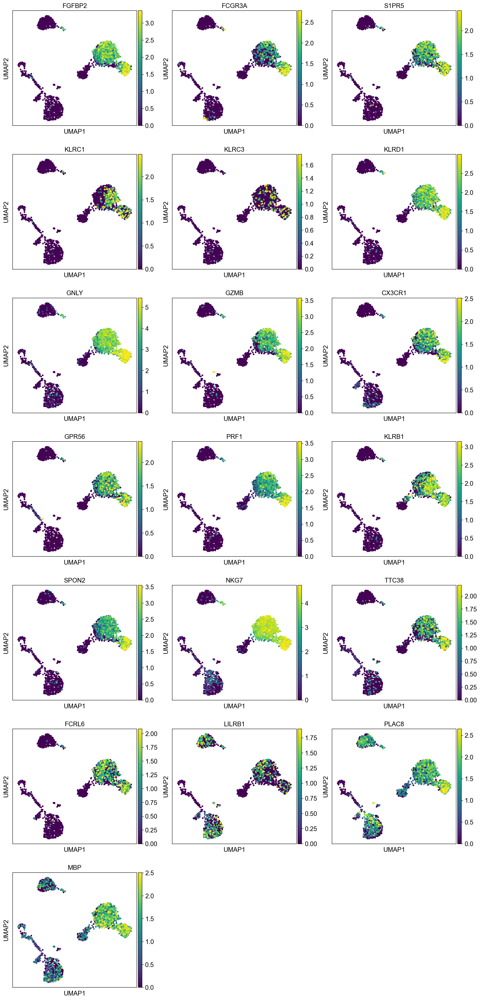

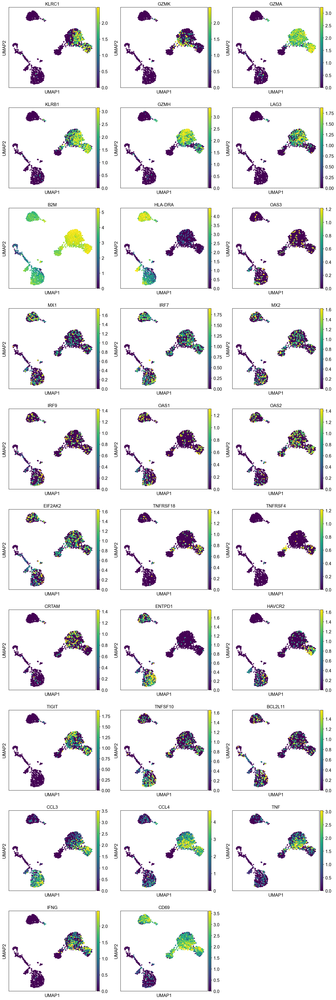

In [28]:
sc.set_figure_params(figsize=(5, 5))

sc.pl.umap(eg35, color= nk_genes, vmax="p99", ncols = 3)

sc.pl.umap(eg35, color= nk_genes2, vmax="p99", ncols = 3)

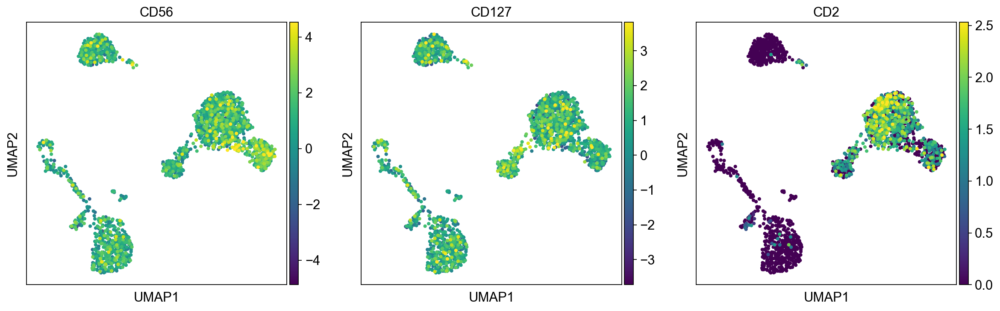

In [30]:
sc.pl.umap(eg35, color= nk_prot, vmax="p99")

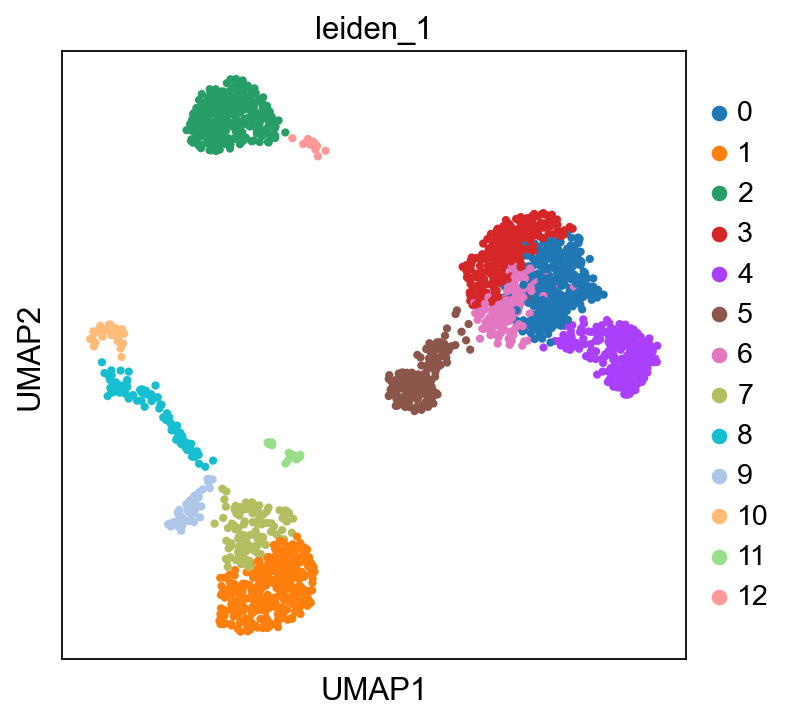

In [31]:
sc.tl.leiden(eg35, resolution = 1, key_added = "leiden_1")

sc.pl.umap(eg35, color=['leiden_1'])

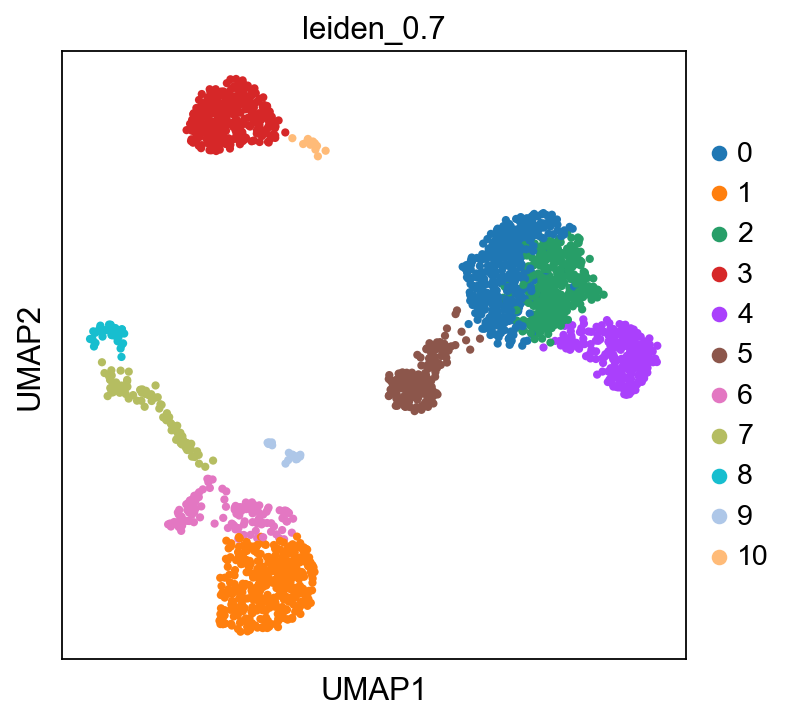

In [32]:
sc.tl.leiden(eg35, resolution = 0.7, key_added = "leiden_0.7")

sc.pl.umap(eg35, color=['leiden_0.7'])

In [ ]:
sc.tl.leiden(eg35, resolution = 1, key_added = "leiden_1")

sc.pl.umap(eg35, color=['leiden_1'])




#selecting NK cell cluster
eg34_nk = eg34[eg34.obs['leiden_1'] == "5"]

eg34_nk.shape

#calculating neigbors for object containing only NK cells, using latent space coordinates

sc.pp.neighbors(eg34_nk, use_rep="X_totalVI")

sc.tl.umap(eg34_nk)

sc.pl.umap(eg34_nk, color = ["cell_type"])

In [61]:
sc.tl.leiden(eg34, resolution = 1, key_added = "leiden_1")

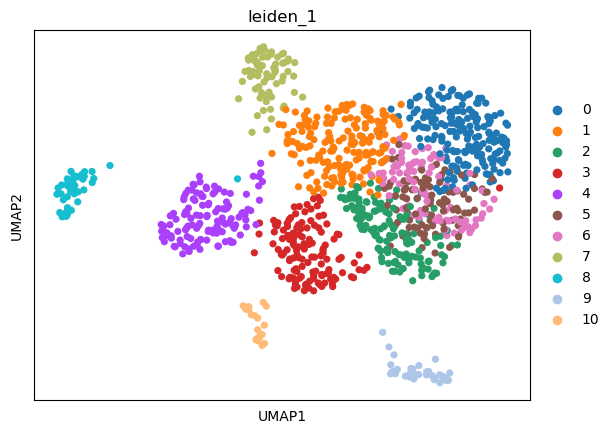

In [62]:
sc.pl.umap(eg34, color=['leiden_1'])

In [64]:
#Markers received from HRUH, KLRC1 = NKG2A
#KLRC2 not found

nk_genes = ["FGFBP2", "FCGR3A", "S1PR5", "KLRC1", "KLRC3", "KLRD1", "GNLY","GZMB", "CX3CR1", "GPR56", "PRF1", "KLRB1", "SPON2", "NKG7", "TTC38", "FCRL6", "LILRB1","PLAC8", "MBP"]

nk_genes2 = ["NKG2A","NCAM1","GZMK","GZMA","KLRB1","KLRC2","GZMH","LAG3","B2M","HLA-DRA","OAS3","MX1","IRF7","MX2","IRF9","OAS1","OAS2", "EIF2AK2", "TNFRSF18", "TNFRSF9",  "TNFRSF4",  "CRTAM", "ENTPD1",  "HAVCR2",  "TIGIT", "TNFSF10", "BCL2L11", "CCL3", "CCL4", "TNF", "IFNG", "CD69"]

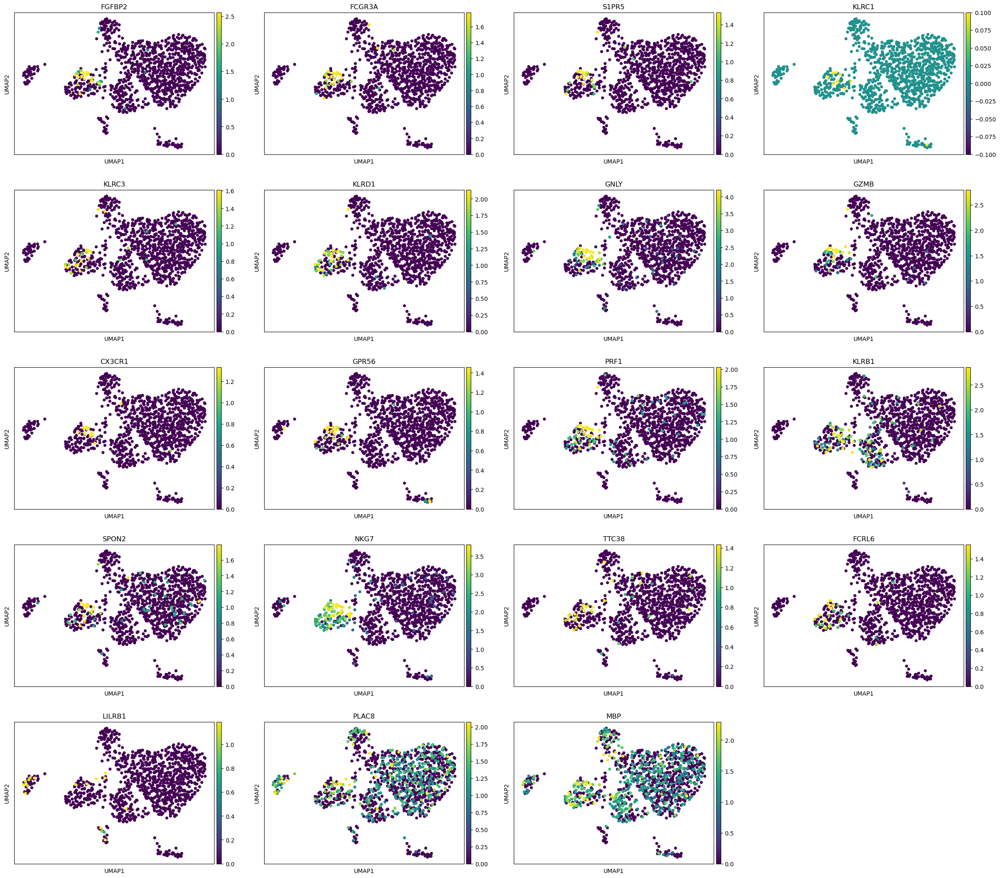

In [69]:
sc.pl.umap(eg34, color= nk_genes, vmax="p99")

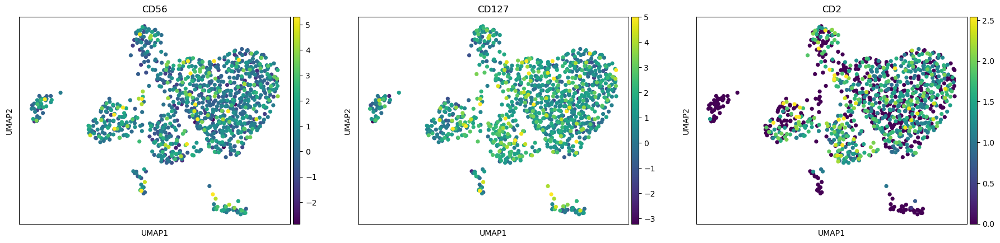

In [71]:
nk_prot = ['CD56', 'CD127', 'CD2']

sc.pl.umap(eg34, color= nk_prot, vmax="p99")

## RNA

In [72]:
df_rna=eg34.to_df()

In [73]:
df_rna

,AL627309.1,AP006222.2,RP11-206L10.3,RP11-206L10.2,RP11-206L10.9,LINC00115,NOC2L,KLHL17,HES4,ISG15,...,MCM3AP-AS1,MCM3AP,YBEY,C21orf58,PCNT,DIP2A,S100B,PRMT2,AL592183.1,SRSF10-1
AAACCTGCAAAGCGGT-1-148,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.974519,0.0,2.028092,0.974519,0.0
AAACCTGCAGAGCCAA-1-148,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.318010,0.000000,0.0
AAACGGGTCAAGAAGT-1-148,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0
AAACGGGTCAGAGACG-1-148,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.924713,0.000000,0.0
AAAGATGAGCACGCCT-1-148,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCCATTCTCAT-1-148,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0
TTTGCGCAGATAGGAG-1-148,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,1.188155,0.000000,0.0
TTTGCGCGTATTCTCT-1-148,0.0,0.0,0.0,0.0,1.249558,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0
TTTGGTTTCAGCACAT-1-148,0.0,0.0,0.0,0.0,0.000000,0.0,1.231395,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.766786,0.0,0.000000,0.000000,0.0


In [75]:
eg34.obsm['adata_x'] = df_rna

In [77]:
eg34

AnnData object with n_obs × n_vars = 1112 × 11501
    obs: 'cell_type', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r2', 'leiden_r2_n_genes_MAD_diff', 'leiden_r2_n_counts_MAD_diff', 'leiden_r2_percent_mito_MAD_diff', 'filter', 'model_group', 'BATCH', 'POOL', 'SAMPLE_SET', 'SAMPLE_TYPE', 'SAMPLE_TISSUE', 'DIAGNOSIS', 'SUBTYPE', 'STATUS', 'eg_code', 'leiden_r1', 'new_cell_type', 'batch_group', 'batch', 'CD19', 'CD10', 'CD20', 'CD3', 'CD2_prot', 'CD11b', 'HLADR', 'CD38_prot', 'CD11c', 'CD7', 'CD45', 'CD33', 'CD81', 'CD73', 'CD123', 'CD14', 'CD45RA', 'CD45RO', 'CD4', 'CD8a', 'CD197', 'CD127', 'CD56', 'CD5', 'CD15', 'CD64', 'CD117', 'CD24', 'CD44_prot', 'CD58', 'CD66ace', 'CD13', 'CD34_prot', 'leiden_1'
    var: 'gene_ids', 'feature_types', 'n_cells-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'n_cells-1', 'highly_variable-1', 'means-1', 'dispersions-1', 'dispersions_norm-1'
    uns: 'neighbors', 'umap', 'cell_type_colors', 'eg_code_colors', 

In [50]:
#Calculating leidens for latent object
sc.tl.leiden(eg48, resolution = 0.5, key_added = "leiden_0.5")
sc.tl.leiden(eg48, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(eg48, resolution = 0.7, key_added = "leiden_0.7")


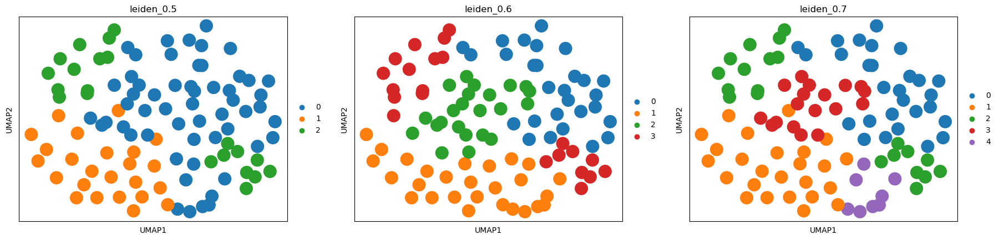

In [51]:
sc.pl.umap(eg48, color=['leiden_0.5', 'leiden_0.6', 'leiden_0.7'], ncols =3)

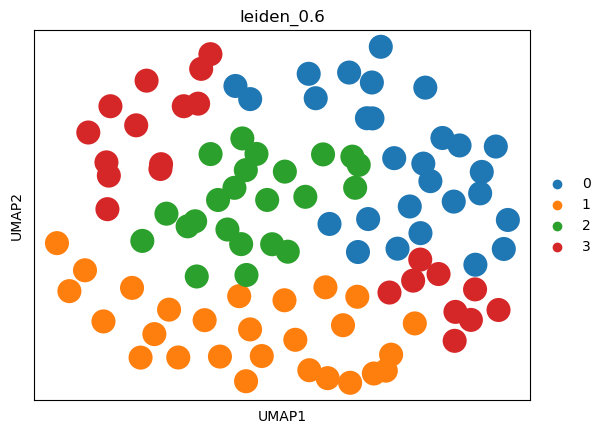

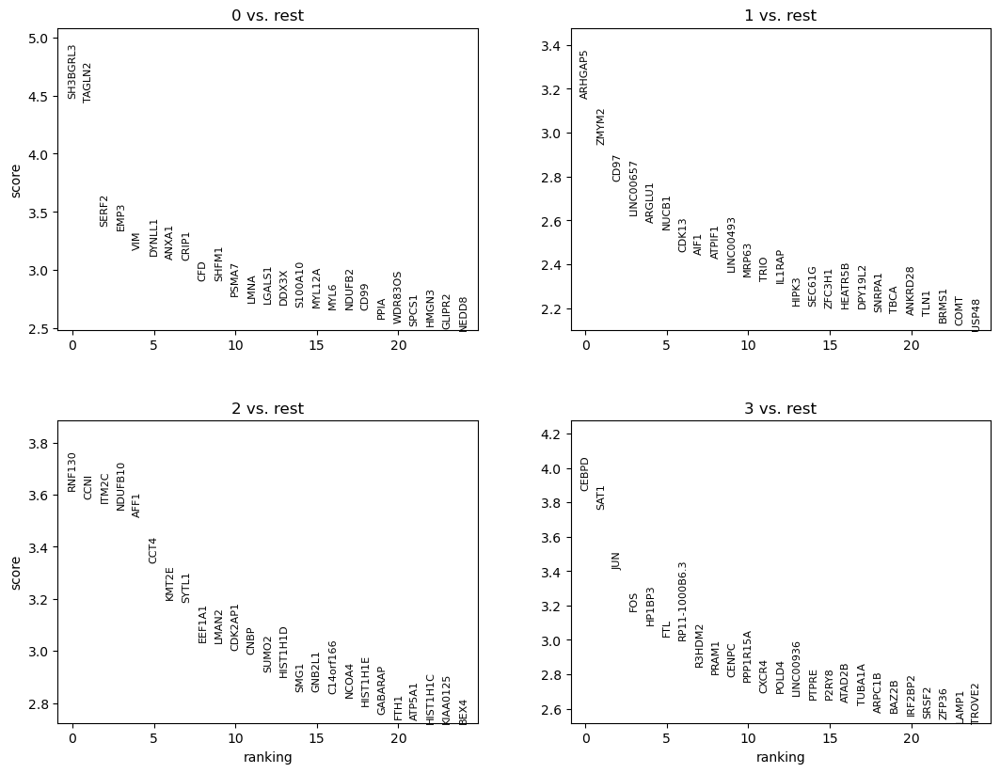

In [52]:
sc.pl.umap(eg48, color=['leiden_0.6'], ncols =3)

sc.tl.rank_genes_groups(eg48, 'leiden_0.6', method='wilcoxon')
sc.pl.rank_genes_groups(eg48, n_genes=25, sharey=False, ncols=2)

In [53]:
#calculating neigbors for object containing only NK cells

sc.pp.neighbors(eg49, use_rep="X_totalVI")

sc.tl.umap(eg49)

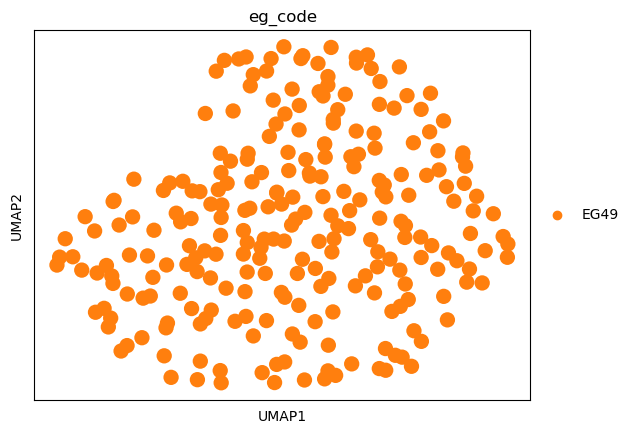

In [54]:
sc.pl.umap(eg49, color = ["eg_code"])

In [55]:
#Calculating leidens for latent object
sc.tl.leiden(eg49, resolution = 0.5, key_added = "leiden_0.5")
sc.tl.leiden(eg49, resolution = 0.6, key_added = "leiden_0.6")
sc.tl.leiden(eg49, resolution = 0.7, key_added = "leiden_0.7")

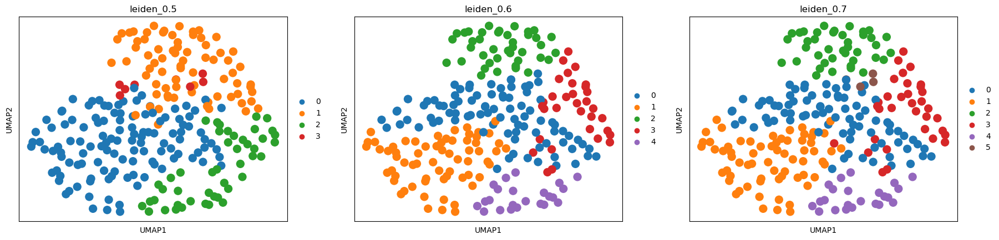

In [56]:
sc.pl.umap(eg49, color=['leiden_0.5', 'leiden_0.6', 'leiden_0.7'], ncols =3)

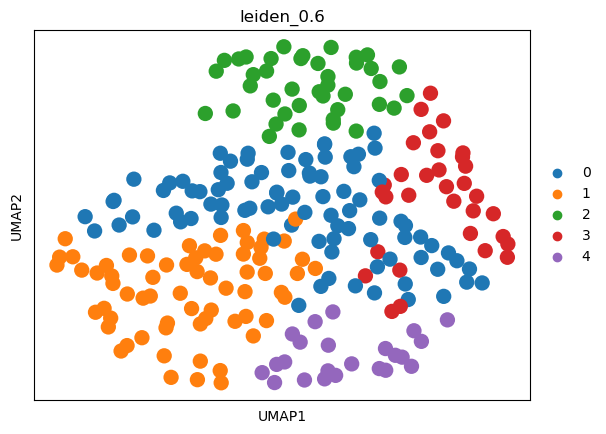

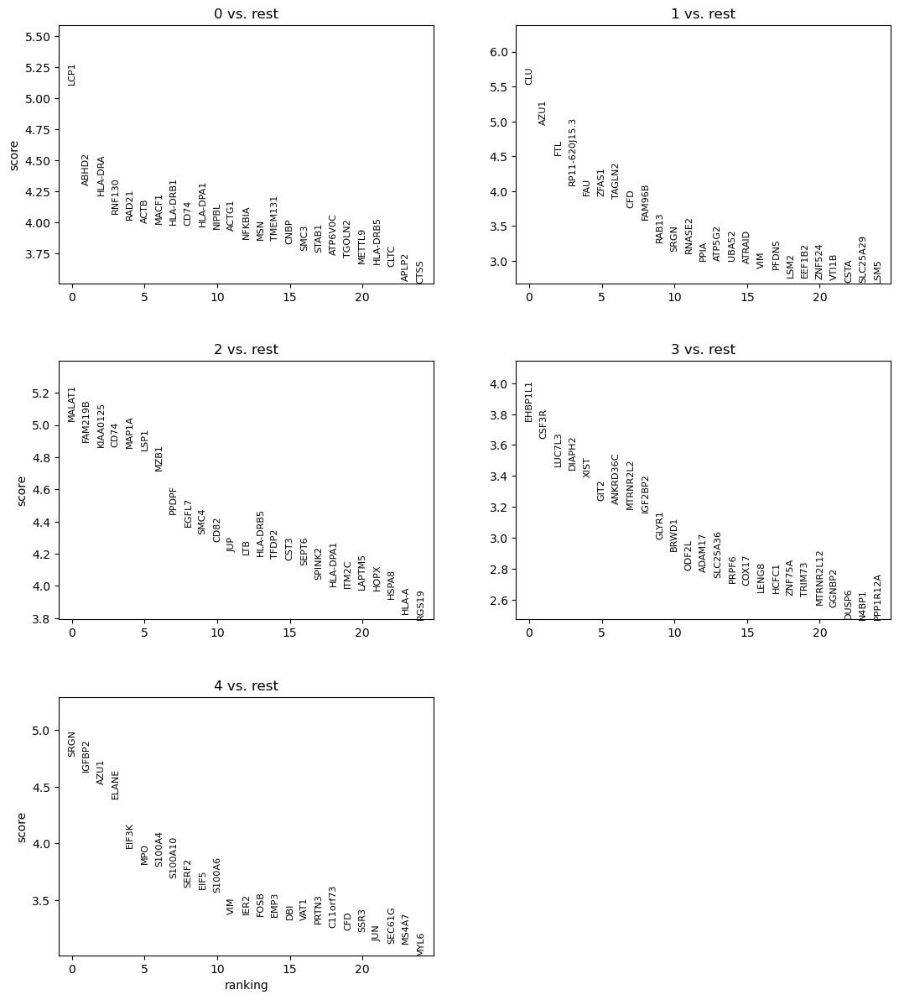

In [57]:
sc.pl.umap(eg49, color=['leiden_0.6'], ncols =3)

sc.tl.rank_genes_groups(eg49, 'leiden_0.6', method='wilcoxon')
sc.pl.rank_genes_groups(eg49, n_genes=25, sharey=False, ncols=2)

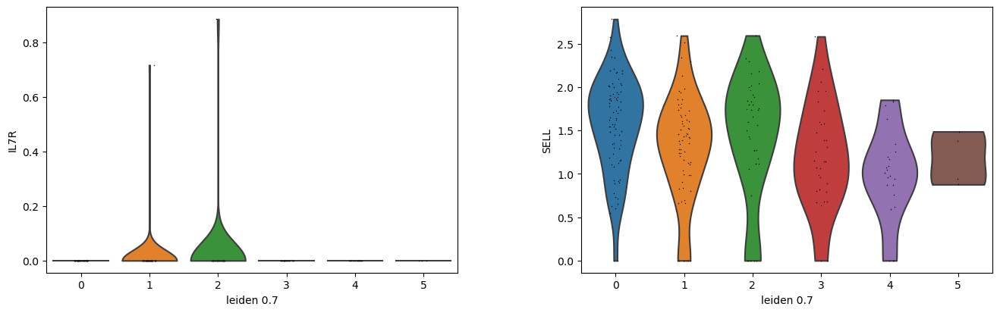

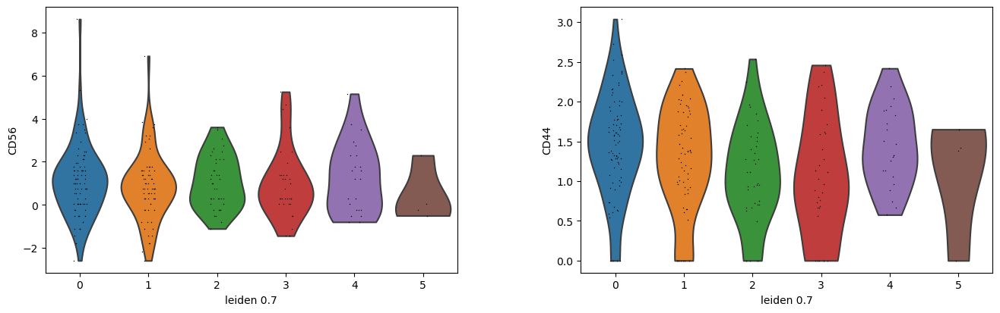

In [60]:
#CD56bright markers

sc.pl.violin(eg49, ['IL7R', 'SELL'], groupby='leiden_0.7')

sc.pl.violin(eg49, ['CD56', 'CD44'], groupby='leiden_0.7')

RNA markers


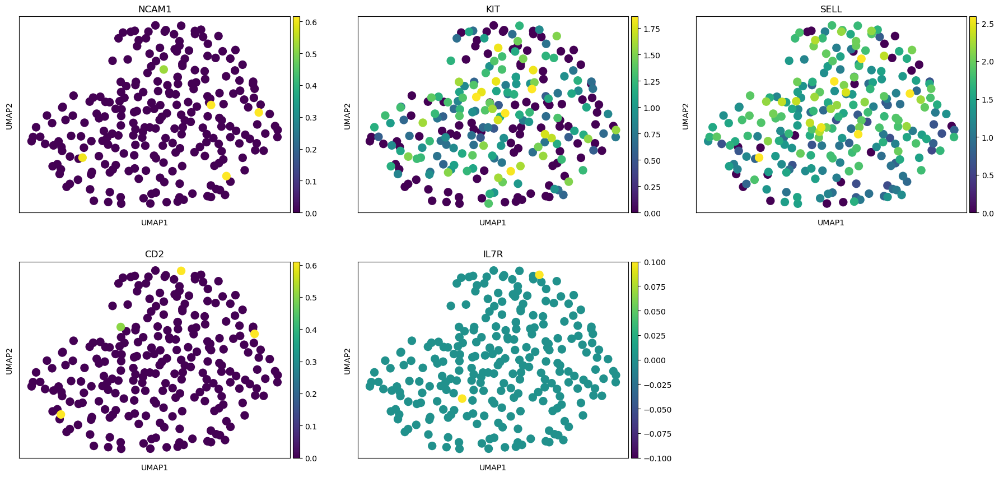

Protein markers


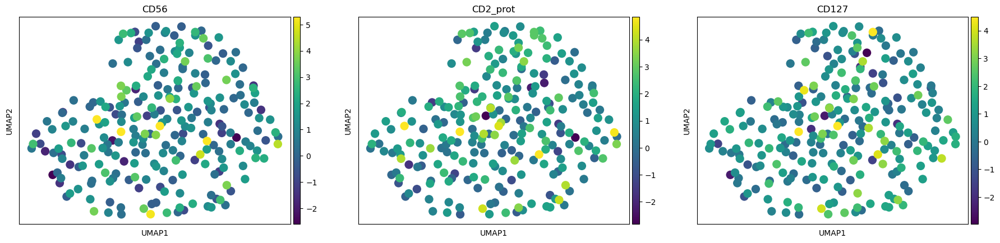

In [61]:
#CD56bright NK cells
#SELL = CD62L, NCAM1 = CD56, IL7R = CD127

cd56bright_mels = ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R'] #KLRC1 not found
cd56bright_mels_prot= ['CD56', "CD2_prot", 'CD127'] #CD62L not measured

print("RNA markers")
sc.pl.umap(eg49, color=cd56bright_mels, ncols = 3, vmax="p99")

print("Protein markers")

sc.pl.umap(eg49, color=cd56bright_mels_prot, ncols = 3, vmax="p99")

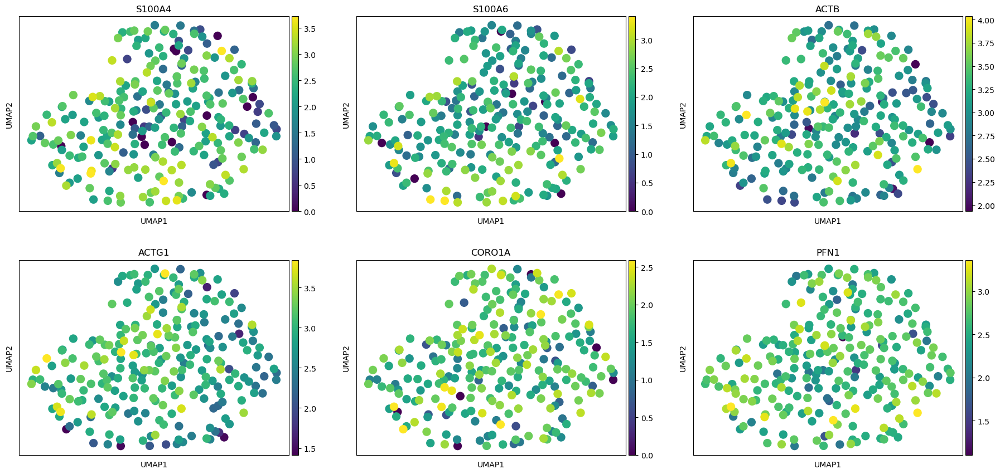

In [62]:
#Mature NK cells

cd56dim_1_high= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1']
# cd56dim_1_low = ['GZMK'] not measured

sc.pl.umap(eg49, color=cd56dim_1_high, ncols = 3, vmax="p99")
#sc.pl.umap(adata_nk, color=cd56dim_1_low, ncols = 3, vmax="p99")



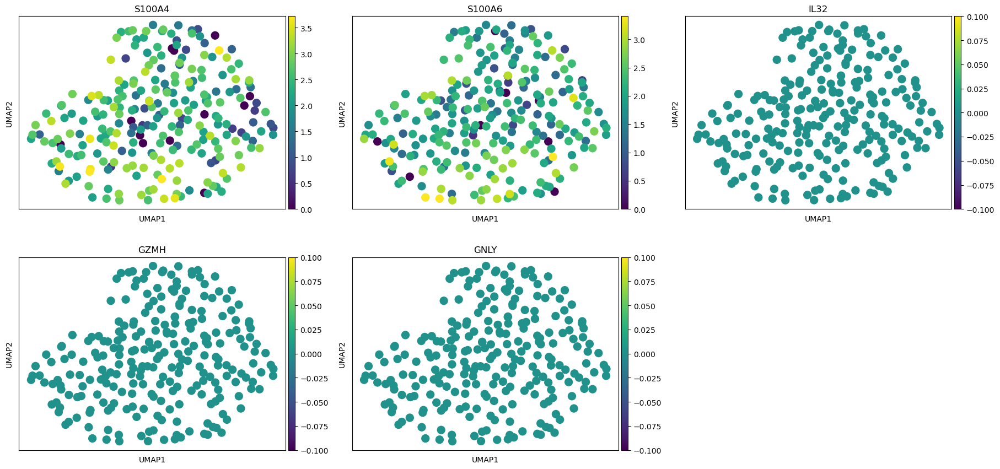

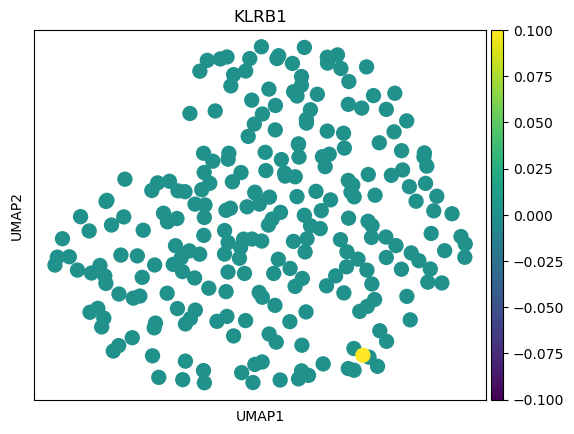

In [64]:
#proliferating NK

prolif_high = ['S100A4', 'S100A6', 'IL32', 'GZMH', 'GNLY'] #KLRC2 not found
prolif_low = ['KLRB1'] #KLRC1 not found

sc.pl.umap(eg49, color=prolif_high, ncols = 3, vmax="p99")
sc.pl.umap(eg49, color=prolif_low, ncols = 3, vmax="p99")

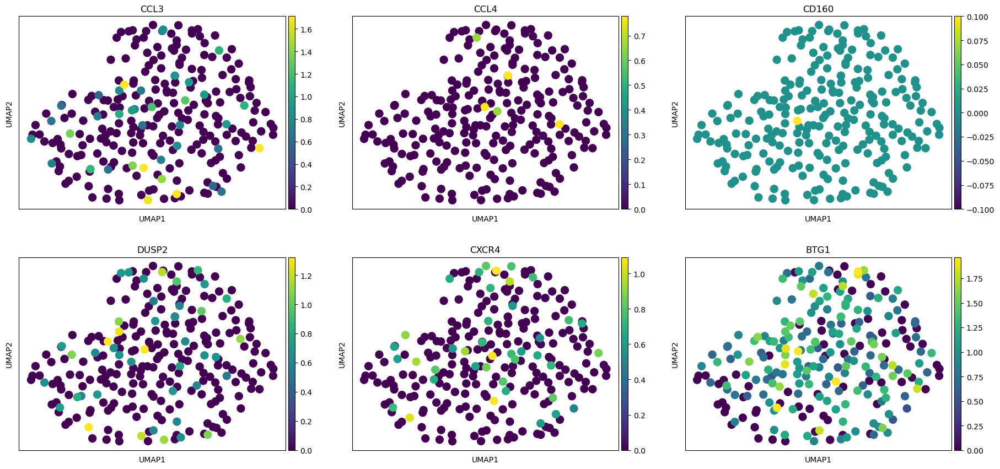

In [65]:
#Tissue-resident NK

tr_mels= ['CCL3', 'CCL4', 'CD160', 'DUSP2', 'CXCR4', 'BTG1'] #XCL1, GZMK not found

sc.pl.umap(eg49, color=tr_mels, ncols = 3, vmax="p99")

## Original files

In [42]:
#Easigenomics dataset, two AA cases

adata_34 = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/easi/EG34.h5ad')

adata_36 = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/easi/EG36.h5ad')

In [43]:
adata_34

AnnData object with n_obs × n_vars = 1112 × 11960
    obs: 'EG_code', 'leiden_r1', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r1_n_genes_MAD_diff', 'leiden_r1_n_counts_MAD_diff', 'leiden_r1_percent_mito_MAD_diff', 'filter'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden_r1_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'protein_expression'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [44]:
adata_36

AnnData object with n_obs × n_vars = 2169 × 13291
    obs: 'EG_code', 'leiden_r1', 'n_genes', 'percent_mito', 'percent_ribo', 'n_counts', 'leiden_r1_n_genes_MAD_diff', 'leiden_r1_n_counts_MAD_diff', 'leiden_r1_percent_mito_MAD_diff', 'filter'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden_r1_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap', 'protein_expression'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

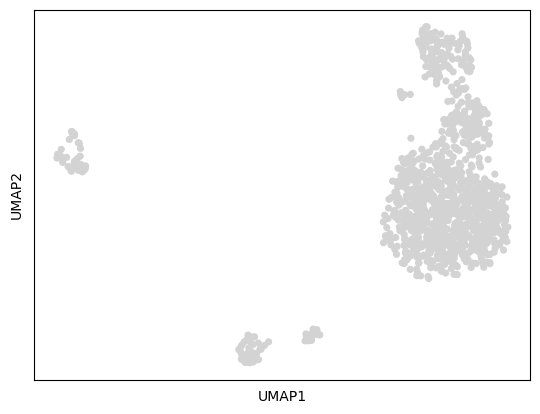

In [45]:
sc.pl.umap(adata_34)

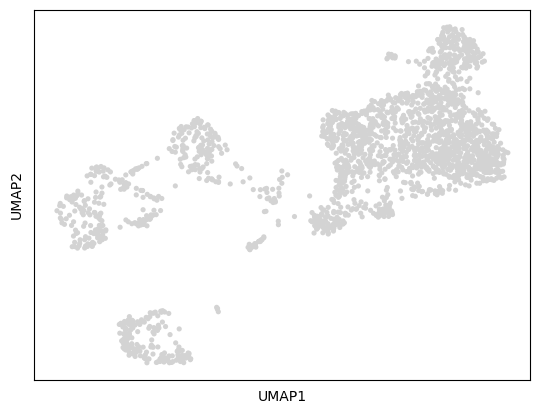

In [46]:
sc.pl.umap(adata_36)